In [9]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import ipt
import mxnet as mx
import my_utils as mu
from intonet import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
from RNN.rnn_load import get
from RNN.rnn import rnn_net
params= ('[ACC-0.08563 E9]',9)
import pickle as pk
with open('../../../DATA/PK/NEW/[T10,N10]<8-11:42:11>.pk','r') as f:
    imgs=pk.load(f)
    ll  =pk.load(f)

from RNN.rnn_iter import RnnIter
val = RnnIter(ll,ll, batch_size=1)
output, img, ll = fetch_internal(rnn_net(begin=mx.sym.Variable(name='data')), val, *params, is_rnn=True) 


['data', 'rnn_i2h_weight', 'rnn_i2h_bias', 'rnn_i2h_output', 'h', 'rnn_h2h_weight', 'rnn_h2h_bias', 'rnn_h2h_output', '_plus8_output', 'rnn_slice_output0', 'rnn_slice_output1', 'rnn_slice_output2', 'rnn_slice_output3', 'activation33_output', 'activation32_output', 'c', '_mul12_output', 'activation30_output', 'activation31_output', '_mul13_output', '_plus9_output', 'activation34_output', '_mul14_output', 'pred_weight', 'pred_bias', 'pred_output', 'reshape6_output', 'softmax_label', 'softmax_output', 'blockgrad8_output', 'blockgrad9_output'] 

Abandoned: data
Abandoned: rnn_i2h_weight
Abandoned: rnn_i2h_bias
Abandoned: h
Abandoned: rnn_h2h_weight
Abandoned: rnn_h2h_bias
Abandoned: c
Abandoned: pred_weight
Abandoned: pred_bias
Abandoned: softmax_label
Abandoned: blockgrad8
Abandoned: blockgrad9
Start Predict
activation34 (10, 2500) -0.0118388 0.206865
activation31 (10, 2500) -0.0238 0.415778
activation30 (10, 2500) 0.498413 0.124849
activation33 (10, 2500) 0.50581 0.123471
activation32 (

activation19 (10, 2500) -0.0118388
activation18 (10, 2500) 0.50581
activation17 (10, 2500) 0.499207
activation16 (10, 2500) -0.0238
activation15 (10, 2500) 0.498413
rnn_i2h (10, 10000) -0.00418559
_plus3 (10, 2500) -0.0125065
rnn_h2h (10, 10000) -0.000109099
rnn_slice (10, 2500) 0.0252179
softmax (10, 10, 256, 256) 0.498452
reshape3 (10, 10, 256, 256) -0.00619319
_mul5 (10, 2500) -0.00533153
_mul4 (10, 2500) -0.0125065
_plus2 (10, 10000) -0.00429469
pred (10, 655360) -0.00619319
_mul3 (10, 2500) 0.0


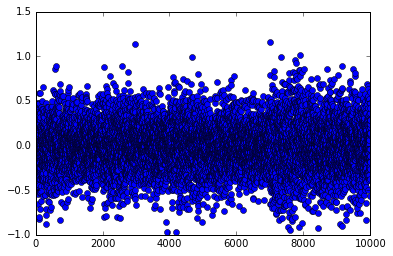

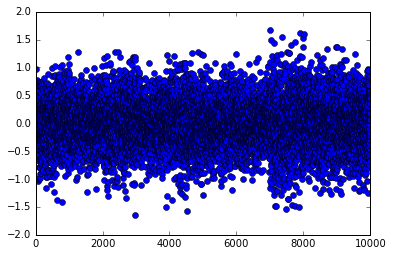

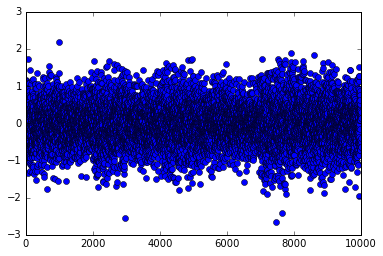

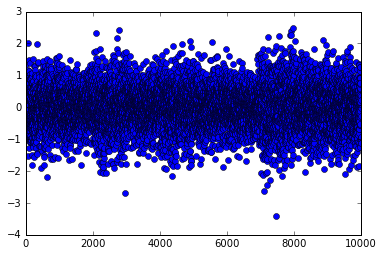

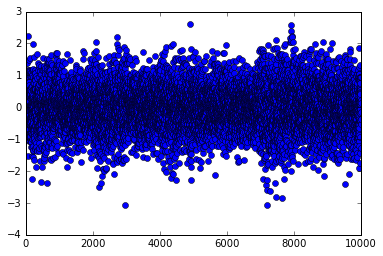

...

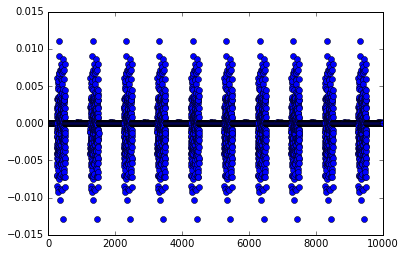

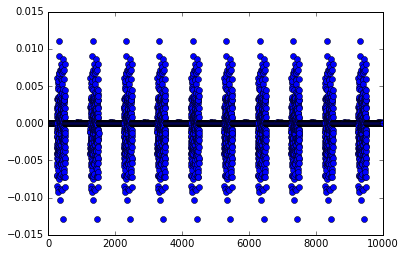

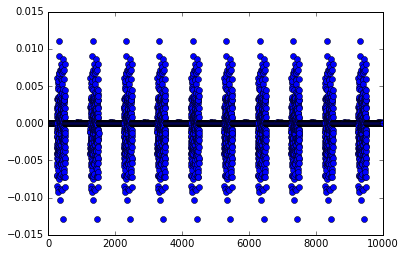

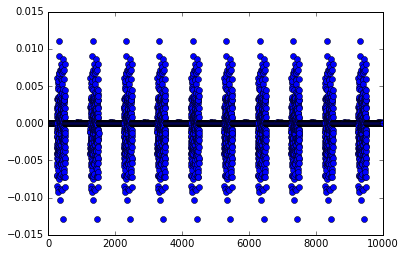

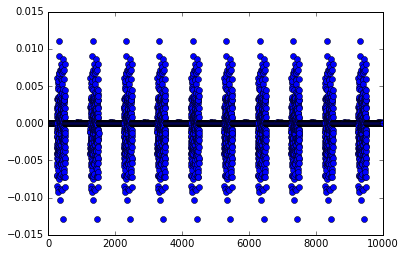

In [22]:
import matplotlib.pyplot as plt
i2h = o['rnn_i2h']
for i in range(10):
    plt.plot(i2h[i],'o')
    plt.show()
for j in range(10):
    plt.plot(o['rnn_h2h'][j],'o')
    plt.show()

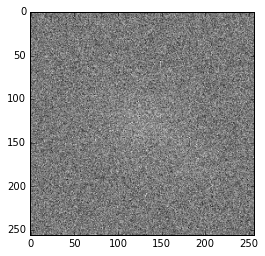

-0.00622546 0.00962188


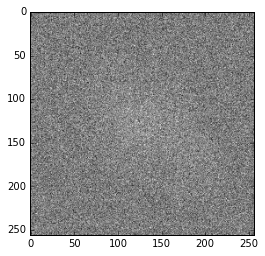

-0.00616898 0.00800872


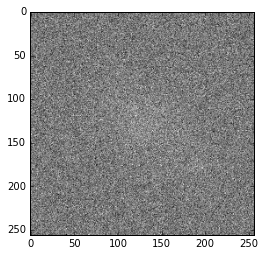

-0.00620355 0.0102554


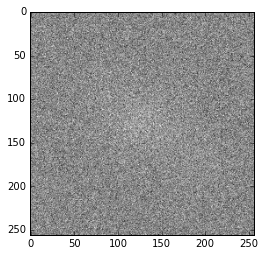

-0.00622124 0.00868512


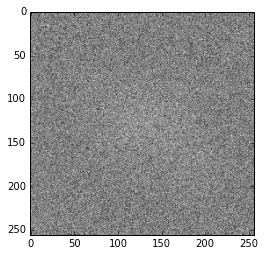

-0.00627545 0.00988505


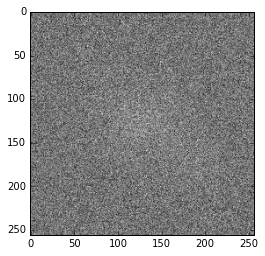

-0.00618733 0.00898241


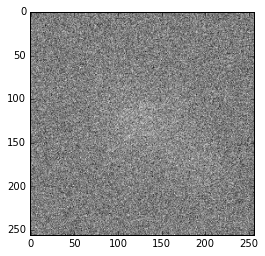

-0.00621611 0.00827646


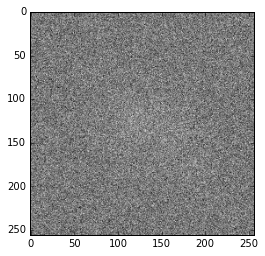

-0.00615718 0.0118374


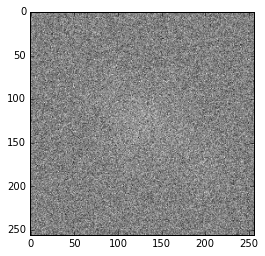

-0.00617131 0.00993014


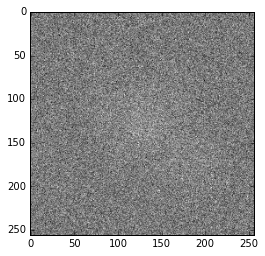

-0.00616927 0.00982769


In [18]:
r = o['reshape3']
for i in range(10):
    mu.show(r[0,i])
    print r[0,i].mean(), r[0,i].std()

['activation19', 'activation18', 'activation17', 'activation16', 'activation15', 'rnn_i2h', '_plus3', 'rnn_h2h', 'rnn_slice', 'softmax', 'reshape3', '_mul5', '_mul4', '_plus2', 'pred', '_mul3']
(10, 10, 256, 256)


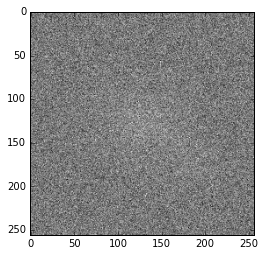

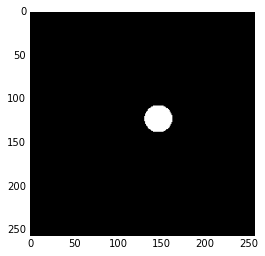

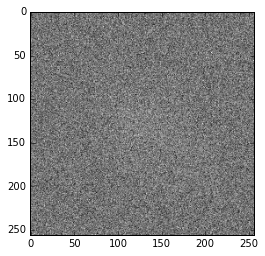

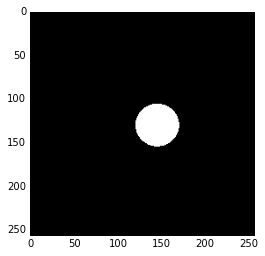

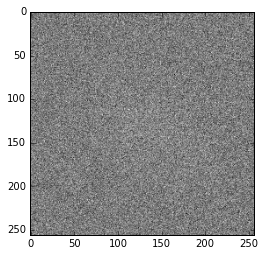

...

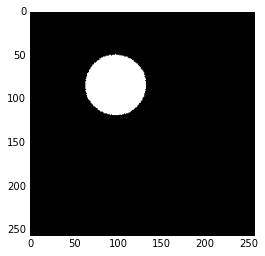

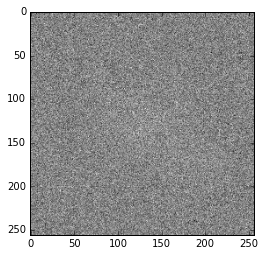

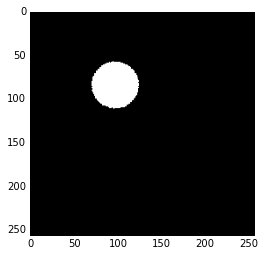

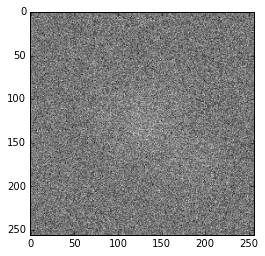

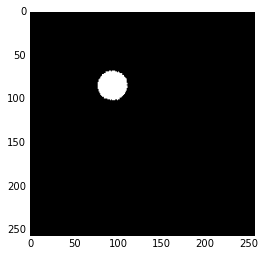

In [11]:
print output.keys()
o = output
print o['softmax'].shape
T,N = o['softmax'].shape[:2]
for n in range(N):
    for t in range(T):
        mu.show(o['softmax'][t,n])
        mu.show(img[t,n])